## Introduction to Data Science

#### University of Redlands - DATA 101
#### Prof: Joanna Bieri [joanna_bieri@redlands.edu](mailto:joanna_bieri@redlands.edu)
#### [Class Website: data101.joannabieri.com](https://joannabieri.com/data101.html)

---------------------------------------
# Homework Day 8
---------------------------------------

GOALS:

1. Load data into Python that you find online
2. Understand data types and fix some errors
3. Find your own data to play with

----------------------------------------------------------

This homework has **5 questions** and **1 problem**.

NOTE: Be kind to yourself. Working with data can be hard! Every data set is different. **Seriously** come get help! Come to lab!


In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.defaule = 'colab'

from itables import show

## Try reading in some data - csv

Go to the [Cal Fire Website](https://www.fire.ca.gov/incidents) and scroll to the bottom to see the Incident Data. We will download the file named **ALL DATA AS CSV** this should put the data file into your Downloads folder. 

Next you need to move the file **mapdataall.csv** from your Downloads folder into your Day8 folder where you are doing your homework. You can open your Downloads folder and drag the file into JupyterLab side bar. Then I can run the command

    DF_raw = pd.read_csv('mapdataall.csv')

to load the data and look at the data frame.

In [29]:
fires_df = pd.read_csv('https://incidents.fire.ca.gov/imapdata/mapdataall.csv')
show(fires_df)
print(fires_df.columns)

Index(['incident_name', 'incident_is_final', 'incident_date_last_update',
       'incident_date_created', 'incident_administrative_unit',
       'incident_administrative_unit_url', 'incident_county',
       'incident_location', 'incident_acres_burned', 'incident_containment',
       'incident_control', 'incident_cooperating_agencies',
       'incident_longitude', 'incident_latitude', 'incident_type',
       'incident_id', 'incident_url', 'incident_date_extinguished',
       'incident_dateonly_extinguished', 'incident_dateonly_created',
       'is_active', 'calfire_incident', 'notification_desired'],
      dtype='object')


**Q1** How many variables and observations?

**Q2** How many different incident types are there?

**Q3** Make a histogram of the acres burned and color the bars by whether or not the incident was a calfire incident. You will probably need to make a mask to remove very small and very large fires. How many fires burned more than 100,000 acres? What is the largest fire in the data?

**Extra Q** EXTRA - CHALLENGE - See if you can create a graph that answers the question: Are fires getting bigger or more frequent over time? You get complete creative control on how to answer this question!

In [26]:
# Q1
print(f'{fires_df.shape[1]} Variables, {fires_df.shape[0]} Observations')

# Q2
print()
print(f'Number of incident types: {fires_df['incident_type'].unique().shape[0]}')

23 Variables, 2732 Observations

Number of incident types: 4


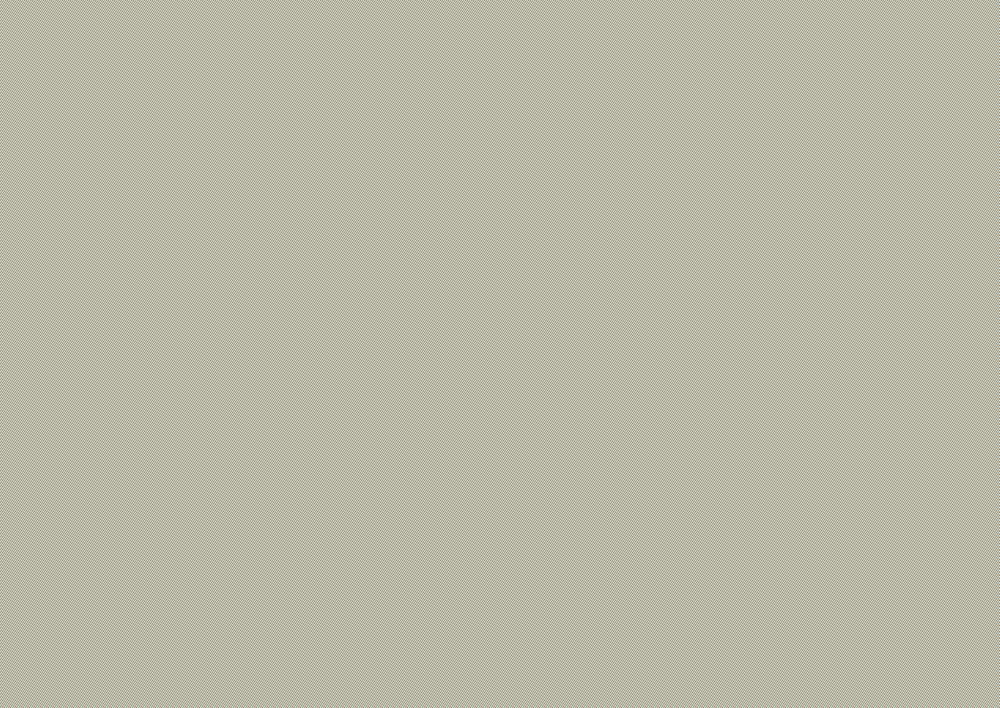


Number of fires larger than 100K acres: 20

Largest fire:
Name: August Complex (includes Doe Fire)
Acres: 1032648.0


In [101]:
# Q3
acres_df = fires_df.loc[(fires_df['incident_acres_burned']<1000) & (fires_df['incident_acres_burned']>0), ['incident_acres_burned']]
fig = px.histogram(acres_df,
                  x='incident_acres_burned',
                  nbins=80)

fig.update_layout(title='Acres Burned Counts',
                  title_x=0.5,
                  xaxis_title="Acres Burned",
                  autosize=False,
                  width=1200,
                  height=900)

fig.update_yaxes(title="Count")

fig.show()

print()
print(f"Number of fires larger than 100K acres: {fires_df[fires_df['incident_acres_burned']>100000].shape[0]}")
print()
largest_fire = fires_df[fires_df['incident_acres_burned'] == fires_df['incident_acres_burned'].max()].iloc[0]
print(f"Largest fire:\nName: {largest_fire['incident_name']}\nAcres: {largest_fire['incident_acres_burned']}")

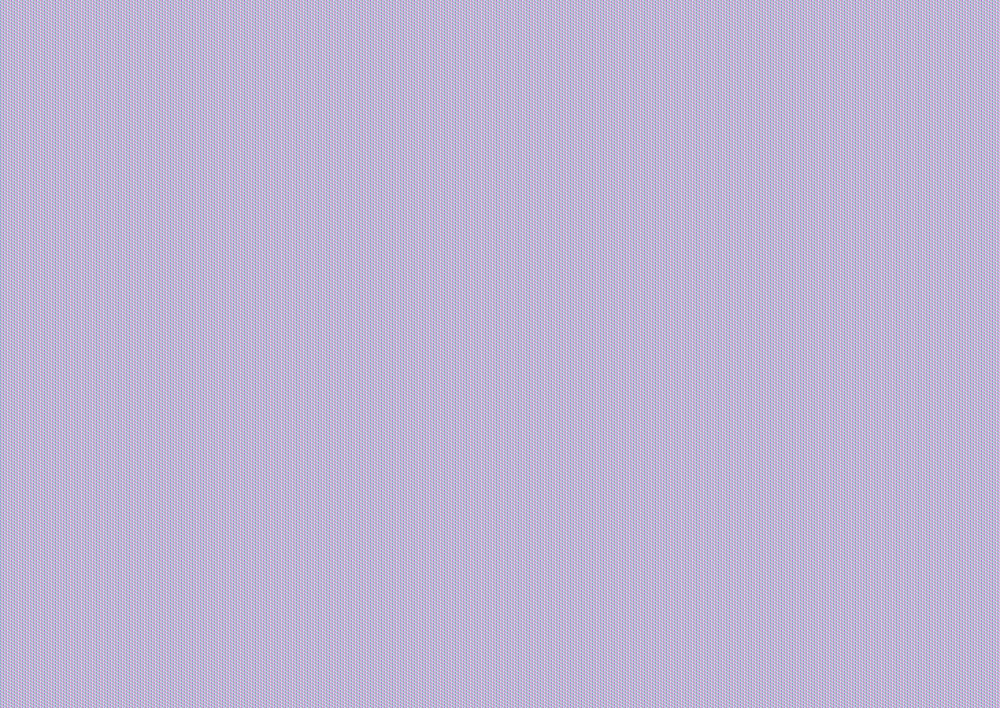

In [161]:
# Q4
#histogram with facets for different years?
acres_df = fires_df.loc[:, ['incident_date_last_update', 'incident_acres_burned']]
fig = px.scatter(acres_df,
                  x='incident_date_last_update',
                y='incident_acres_burned')

fig.update_layout(title='Acres Burned Counts',
                  title_x=0.5,
                  xaxis_title="Acres Burned",
                  autosize=False,
                  width=1200,
                  height=900)

fig.show()

Especially after around 2016 it does seem as though we are seeing more dots edging towards the 0.1M acres mark.

## Try reading in some data from Wikipedia - html

Here we will explore academy award winning films. Go to the [Wiki for the List of Academy Award Winning Films](https://en.wikipedia.org/wiki/List_of_Academy_Award%E2%80%93winning_films). Look at what type of data is there. How many tables? Any weird looking data?

Now read the html data into Python and show the data in DF[0]

In [112]:
# Your code here
oscar_dfs = pd.read_html('https://en.wikipedia.org/wiki/List_of_Academy_Award%E2%80%93winning_films')
show(oscar_dfs[0])

In [124]:
# Here is some helper code
# This is code that will read in the data and then fix the Year column
my_website = "https://en.wikipedia.org/wiki/List_of_Academy_Award%E2%80%93winning_films"
DF = pd.read_html(my_website)
DF_raw = DF[0]
DF_raw['Year'] = DF_raw['Year'].apply(lambda x: int(x.split('/')[0]))
DF_raw['Year'].value_counts().reset_index().rename(columns={"index": "value", 0: "count"})

,Year,count
0,1945,21
1,1949,20
2,1942,20
3,1948,19
4,1941,19
...,...,...
91,1931,10
92,1932,9
93,1928,7
94,1930,6


**Q4** Following along with the lecture notes or video, fix the data in the 'Awards' column.

In [127]:
# Your code here
DF_raw['Awards'] = DF_raw['Awards'].apply(lambda a: int(a.split('(')[0]))
show(DF_raw)

**Q5** Now try to fix the data in the "Nominations" column - see if you can do it without looking at the answer.

In [130]:
# Your code here
DF_raw['Nominations'] = DF_raw['Nominations'].apply(lambda a: int(a.split('[')[0]))
show(DF_raw)

In [132]:
DF_raw.dtypes

Film           object
Year            int64
Awards          int64
Nominations     int64
dtype: object

## Problem 1

Your homework today will be to see if you can find some data of your own. This can be the first steps you take toward your final project. 

You should:

* Find some data online
* Read that data into Python using the Pandas commands we learned
* Look at the DataFrame - number of variables, number of observations, AND the dtypes. Comment on what you see.
* Try to do summary statistics (.describe()). Does it work like expected?
* Attempt to fix any data, or explain why the data does not need to be fixed.
* Make some sort of graph using columns in your data.

In [140]:
#small dataset of EVs in WA circa 2020
ev_df = pd.read_csv(r'Data101/Day7/Electric_Vehicle_Population_Data_20241003.csv')
show(ev_df)

In [152]:
print("Shape:",ev_df.shape)
print()
print("DTypes")
print(ev_df.dtypes)

Shape: (205439, 17)

DTypes
VIN (1-10)                                            object
County                                                object
City                                                  object
State                                                 object
Postal Code                                          float64
Model Year                                             int64
Make                                                  object
Model                                                 object
Electric Vehicle Type                                 object
Clean Alternative Fuel Vehicle (CAFV) Eligibility     object
Electric Range                                       float64
Base MSRP                                            float64
Legislative District                                 float64
DOL Vehicle ID                                         int64
Vehicle Location                                      object
Electric Utility                                      obj

200K+ EVs seems like a lot. Given that there are ~7.8M people in Washington, apparently ~2.5% of people have an electric vehicle or hybrid plug in vehicle. All the dtypes are nice and clean.

In [155]:
ev_df.describe()

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,205436.000000,205439.000000,205431.000000,205431.000000,204997.000000,2.054390e+05,2.054360e+05
mean,98177.971870,2020.960363,52.164342,922.670532,28.970848,2.277156e+08,5.297704e+10
std,2419.037479,2.989059,88.075859,7761.753602,14.910052,7.205737e+07,1.588435e+09
min,1731.000000,1997.000000,0.000000,0.000000,1.000000,4.469000e+03,1.001020e+09
25%,98052.000000,2019.000000,0.000000,0.000000,17.000000,1.935324e+08,5.303301e+10
50%,98125.000000,2022.000000,0.000000,0.000000,33.000000,2.382368e+08,5.303303e+10
75%,98372.000000,2023.000000,48.000000,0.000000,42.000000,2.618718e+08,5.305307e+10
max,99577.000000,2025.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.602100e+10


Postal code, census tract, vehicle ID, and legislative district aren't really helped by having summary statistics. Also, many vehicles do not have a listed electric range or base msrp, and it defaults to 0. That might want a mask.

The data seems to be clean. I got this straight off the official data.wa.gov site as a csv.

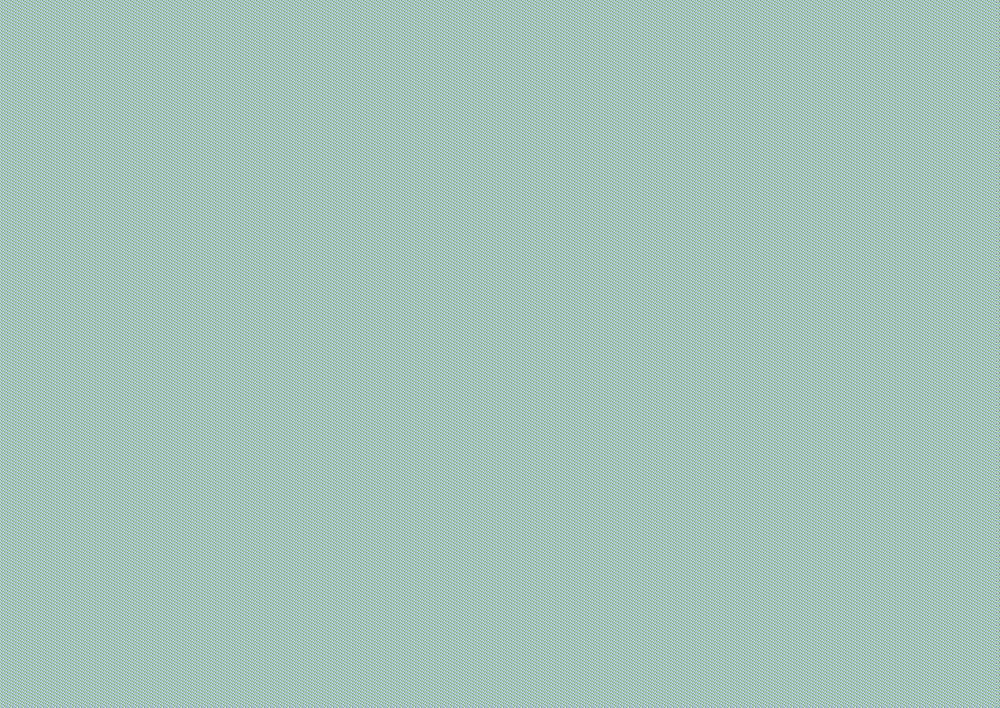

In [182]:
miles_df = ev_df.loc[ev_df['Electric Range']>0, ['Model Year', 'Electric Range', 'Make', 'Electric Vehicle Type', 'Model']]

fig = px.scatter(miles_df,
                  x='Model Year',
                y='Electric Range',
                color='Electric Vehicle Type',
                hover_data=['Make','Model'])

fig.update_layout(title='Electric Range by Year and EV Type',
                  title_x=0.5,
                  autosize=False,
                  width=1200,
                  height=900)

fig.show()

There definitely seems to be a slow increase in electric mileage among the plugin hybrid EVs. With pure electric EVs the trend is a bit more muddied, but it seems that since 2020 no one is even bothering to make EVs that range less than 100 miles.